## Capstone Project: Airbnb Listings price suggestion in Singapore
------------------------------------------------------------------------------------------------------------------------
## Part 1. Data Cleaning

### Problem statement

At Airbnb, we have noticed homeowners listing their apartments/homes for above market rates. This has resulted in low click-rates & overall booking uptime. Our marketing team has consulted our data science team to come up with a model to help accurately predict competitive pricings for these listings.

Our Data science team have worked tirelessly to predict home listing prices competitively.

Our GUI application intends to provide the marketing team with a tool to help them predict the competitive price for a particular listing. This allows Airbnb to connect with our customers to connect with more homeowners and provide a value added service to increase their overall booking uptime. 

Note: This is similar to other e-commerce sites like Carousell and Amazon, where they provide a price suggestion tool to help sellers price their products competitively.

## Table of Contents
- [Importing the libraries](#Importing-the-libraries)
- [Importing the datasets](#Importing-the-datasets)
- [Inspect Data](#Inspect-Data)
- [Data Cleaning](#Data-Cleaning)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)

### Importing the libraries

In [438]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import pickle

import geopandas as gpd
import folium

pd.pandas.set_option('display.max_columns', None)
pd.pandas.set_option('display.max_rows', None)

### Importing the datasets

In [439]:
# Read in the data
calendar = pd.read_csv('./data/calendar.csv.gz', compression = 'gzip', header = 0, sep = ',', quotechar = '"')
listings = pd.read_csv('./data/listings.csv.gz', compression = 'gzip', header = 0, sep = ',', quotechar = '"')
reviews = pd.read_csv('./data/reviews.csv.gz', compression = 'gzip', header = 0, sep = ',', quotechar = '"')

### Data Cleaning

In [440]:
listings = pd.read_csv('./data/listings.csv.gz', compression = 'gzip', header = 0, sep = ',', quotechar = '"')

In [441]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4161 entries, 0 to 4160
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4161 non-null   int64  
 1   listing_url                                   4161 non-null   object 
 2   scrape_id                                     4161 non-null   int64  
 3   last_scraped                                  4161 non-null   object 
 4   source                                        4161 non-null   object 
 5   name                                          4161 non-null   object 
 6   description                                   4068 non-null   object 
 7   neighborhood_overview                         2636 non-null   object 
 8   picture_url                                   4161 non-null   object 
 9   host_id                                       4161 non-null   i

The dataset contains information on 4161 listings and 75 features of the Airbnb listings in Singapore. The data was retrieved from InsideAirbnb.com and last compiled on 22 September 2022.


In [442]:
listings.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,50646,https://www.airbnb.com/rooms/50646,20220922191314,2022-09-23,previous scrape,Pleasant Room along Bukit Timah,Fully furnished bedroom with a nice view on th...,The serenity & quiet surrounding makes it an i...,https://a0.muscache.com/pictures/36342984/670d...,227796,https://www.airbnb.com/users/show/227796,Sujatha,2010-09-08,Singapore,"I am a working professional, living in Singapo...",a few days or more,0%,NaN,f,https://a0.muscache.com/im/pictures/user/8fd2c...,https://a0.muscache.com/im/pictures/user/8fd2c...,Bukit Timah,1,4,"['email', 'phone', 'work_email']",t,t,"Singapore, Singapore",Bukit Timah,Central Region,1.33432,103.78521,Private room in rental unit,Private room,2,NaN,1 bath,1.0,1.0,"[""Gym"", ""Washer"", ""Kitchen"", ""TV with standard...",$80.00,92,730,92.0,92.0,730.0,730.0,92.0,730.0,NaN,t,30,60,90,365,2022-09-23,18,0,0,2014-04-18,2014-12-26,4.56,4.72,4.78,4.78,4.94,4.72,4.50,NaN,f,1,0,1,0,0.18
1,71609,https://www.airbnb.com/rooms/71609,20220922191314,2022-09-22,city scrape,Ensuite Room (Room 1 & 2) near EXPO,For 3 rooms.Book room 1&2 and room 4<br /><br ...,NaN,https://a0.muscache.com/pictures/24453191/3580...,367042,https://www.airbnb.com/users/show/367042,Belinda,2011-01-29,Singapore,Hi My name is Belinda -Housekeeper \n\nI would...,within an hour,100%,100%,f,https://a0.muscache.com/im/users/367042/profil...,https://a0.muscache.com/im/users/367042/profil...,Tampines,6,15,"['email', 'phone']",t,t,NaN,Tampines,East Region,1.34537,103.95887,Private room in villa,Private room,6,NaN,1 private bath,2.0,3.0,"[""Children\u2019s books and toys"", ""Iron"", ""Ke...",$145.00,92,1125,92.0,92.0,1125.0,1125.0,92.0,1125.0,NaN,t,5,35,65,340,2022-09-22,20,0,0,2011-12-19,2020-01-17,4.44,4.37,4.00,4.63,4.78,4.26,4.32,NaN,f,6,0,6,0,0.15
2,71896,https://www.airbnb.com/rooms/71896,20220922191314,2022-09-22,city scrape,B&B Room 1 near Airport & EXPO,<b>The space</b><br />Vocational Stay Deluxe B...,NaN,https://a0.muscache.com/pictures/2440674/ac4f4...,367042,https://www.airbnb.com/users/show/367042,Belinda,2011-01-29,Singapore,Hi My name is Belinda -Housekeeper \n\nI would...,within an hour,100%,100%,f,https://a0.muscache.com/im/users/367042/profil...,https://a0.muscache.com/im/users/367042/profil...,Tampines,6,15,"['email', 'phone']",t,t,NaN,Tampines,East Region,1.34754,103.95958,Private room in home,Private room,1,NaN,Shared half-bath,1.0,1.0,"[""Paid parking on premises"", ""Keypad"", ""Fire p...",$85.00,92,1125,92.0,92.0,1125.0,1125.0,92.0,1125.0,NaN,t,0,1,1,265,2022-09-22,24,0,0,2011-07-30,2019-10-13,4.16,4.22,4.09,4.43,4.43,4.17,4.04,NaN,t,6,0,6,0,0.18
3,71903,https://www.airbnb.com/rooms/71903,20220922191314,2022-09-22,c

In [443]:
listings.shape

(4161, 75)

In [444]:
listings.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,4.161000e+03,4.161000e+03,4.161000e+03,4161.000000,4161.000000,4161.000000,4161.000000,4161.000000,0.0,3757.000000,4057.000000,4161.000000,4161.000000,4160.000000,4160.000000,4160.000000,4160.000000,4160.000000,4160.000000,0.0,4161.000000,4161.000000,4161.000000,4161.000000,4161.000000,4161.000000,4161.000000,2610.000000,2567.000000,2567.000000,2567.000000,2568.000000,2567.000000,2567.000000,4161.000000,4161.000000,4161.000000,4161.000000,2610.000000
mean,1.354784e+17,2.022092e+13,1.559857e+08,73.155011,118.058399,1.344527,103.815150,3.288873,NaN,1.461006,1.956372,57.566931,801.305936,57.137740,59.552644,907.970433,916.538942,59.319832,914.202067,NaN,16.328767,36.522711,58.079308,247.704158,13.999039,3.971641,0.511896,4.473590,4.599969,4.502139,4.685621,4.693384,4.701991,4.494714,40.652968,31.187455,8.931507,0.207883,1.000824
std,2.653249e+17,1.570501e+00,1.356249e+08,131.651559,203.491739,0.066965,0.065450,2.419709,NaN,0.778358,2.057320,65.746522,1598.917341,65.734692,76.289861,1671.851914,1669.750461,75.609024,1670.172352,NaN,12.475632,24.659918,36.052945,132.564024,35.696457,11.759577,1.670852,0.857918,0.637802,0.653106,0.583110,0.601927,0.499307,0.633892,61.386130,59.126819,19.581999,1.299147,1.593726
min,5.064600e+04,2.022092e+13,2.366600e+04,1.000000,1.000000,1.248260,103.635300,0.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.010000
25%,2.507292e+07,2.022092e+13,4.187059e+07,3.000000,5.000000,1.296100,103.769550,2.000000,NaN,1.000000,1.000000,1.000000,365.000000,1.000000,1.000000,365.000000,365.000000,1.000000,365.000000,NaN,0.000000,2.000000,18.000000,126.000000,0.000000,0.000000,0.000000,4.390000,4.500000,4.330000,4.650000,4.670000,4.630000,4.330000,3.000000,0.000000,0.000000,0.000000,0.080000
50%,3.990020e+07,2.022092e+13,1.367001e+08,13.000000,20.000000,1.313930,103.840400,2.000000,NaN,1.000000,1.000000,92.000000,1125.000000,92.000000,92.000000,1125.000000,1125.000000,92.000000,1125.000000,NaN,21.000000,50.000000,79.000000,322.000000,1.000000,0.000000,0.000000,4.730000,4.800000,4.690000,4.870000,4.900000,4.860000,4.670000,10.000000,2.000000,1.000000,0.000000,0.340000
75%,5.319607e+07,2.022092e+13,2.388916e+08,61.000000,109.000000,1.414620,103.855030,4.000000,NaN,2.000000,2.000000,92.000000,1125.000000,92.000000,92.000000,1125.000000,1125.000000,92.000000,1125.000000,NaN,29.000000,59.000000,89.000000,361.000000,10.000000,2.000000,0.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.910000,46.000000,21.000000,6.000000,0.000000,1.140000
max,7.208120e+17,2.022092e+13,4.804050e+08,503.000000,708.000000,1.488000,103.977662,16.000000,NaN,8.000000,46.000000,1000.000000,100000.000000,1000.000000,1000.000000,100000.000000,100000.000000,1000.000000,100000.000000,NaN,30.000000,60.000000,90.000000,365.000000,413.000000,230.000000,35.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,217.000000,199.000000,95.000000,14.000000,15.260000


In [445]:
# Convert price to numeric
listings['price'] = listings['price'].str.replace(',', '')
listings['price'] = listings['price'].str.replace('$', '')
listings['price'] = listings['price'].astype(float)

<ipython-input-445-ae974dcc460a>:3: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.



In [446]:
listings.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

### Drop initial columns

The listing features consists of the following categories
- Name and description of listing
- Host detail (name, location, response time, total listings, superhost)
- Neighbourhood (Neighbourhood, Neighbourhood group, latitude, longitude)
- Property and prices (Property type, room type, no. of guests, beds, bathrooms, amenities, instant booking, Price, minimal night, maximum night ...)
- Availiability (calendar, 30,60, 90, 365 days availability)
- Reviews (No. of reviews, review scores)
- Calculated values (Host's listings for entire homes and private rooms, reviews per month)

#### Name and description of listing

The following columns are related to the name and description of the listing

#### Listing descriptions

In [447]:
listings_description = ['id','listing_url','scrape_id', 'last_scraped', 'name', 'description','neighborhood_overview', 'picture_url']

We will keep the following description columns, the rest of the columns are not useful for price prediction

In [448]:
listings_description = ['id','name','description']

#### Host Details

In [449]:
host_details = ['host_id', 'host_url','host_name', 'host_since', 'host_location', 'host_about','host_response_time', 'host_response_rate', 'host_acceptance_rate',
                'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count',
                'host_verifications', 'host_has_profile_pic', 'host_identity_verified']

We will keep the following columns  as these might affect the price of the Airbnb listing

In [450]:
host_details = ['host_id','host_name','host_response_time', 'host_response_rate', 'host_acceptance_rate','host_is_superhost', 'host_has_profile_pic', 'host_identity_verified' ]

#### Neighbourhood

In [451]:
neighbourhood_details = ['neighbourhood','neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude','longitude']

We will keep the columns as they are essential for our analysis.

#### Property Details

In [452]:
property_details = ['property_type', 'room_type', 'accommodates', 'bathrooms','bathrooms_text', 'bedrooms', 'beds', 'amenities', 'instant_bookable',
                    'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights',
                    'maximum_maximum_nights', 'minimum_nights_avg_ntm','maximum_nights_avg_ntm']

As we are not interested in the pricing based on the calendar data, we will drop the columns related to the calendar data.

In [453]:
property_details = ['property_type', 'room_type', 'accommodates', 'bathrooms','bathrooms_text', 'bedrooms', 'beds', 'amenities', 'instant_bookable','price']

#### Calendar availability

In [454]:
calendar_available = ['availability_30', 'availability_60', 'availability_90','availability_365', 'calendar_last_scraped']

For our analysis, we will use the following columns:

In [455]:
calendar_available = ['availability_30', 'availability_60', 'availability_90','availability_365']

#### Review details

In [456]:
reviews = ['number_of_reviews', 'number_of_reviews_ltm', 'first_review','last_review', 'review_scores_rating', 'review_scores_accuracy',
           'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location',
           'review_scores_value', 'license', 'reviews_per_month']

We will concentrate on the following columns

In [457]:
reviews = ['number_of_reviews','reviews_per_month', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']

#### Calculated values

In [458]:
calculated_details = ['calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms']

### Impute missing values

In [459]:
features = listings_description + host_details + neighbourhood_details + calendar_available + property_details + reviews + calculated_details

In [460]:
# Create a new dataframe with the features
listings = listings[features]

In [461]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4161 entries, 0 to 4160
Data columns (total 42 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4161 non-null   int64  
 1   name                                          4161 non-null   object 
 2   description                                   4068 non-null   object 
 3   host_id                                       4161 non-null   int64  
 4   host_name                                     4161 non-null   object 
 5   host_response_time                            3471 non-null   object 
 6   host_response_rate                            3471 non-null   object 
 7   host_acceptance_rate                          3590 non-null   object 
 8   host_is_superhost                             4160 non-null   object 
 9   host_has_profile_pic                          4161 non-null   o

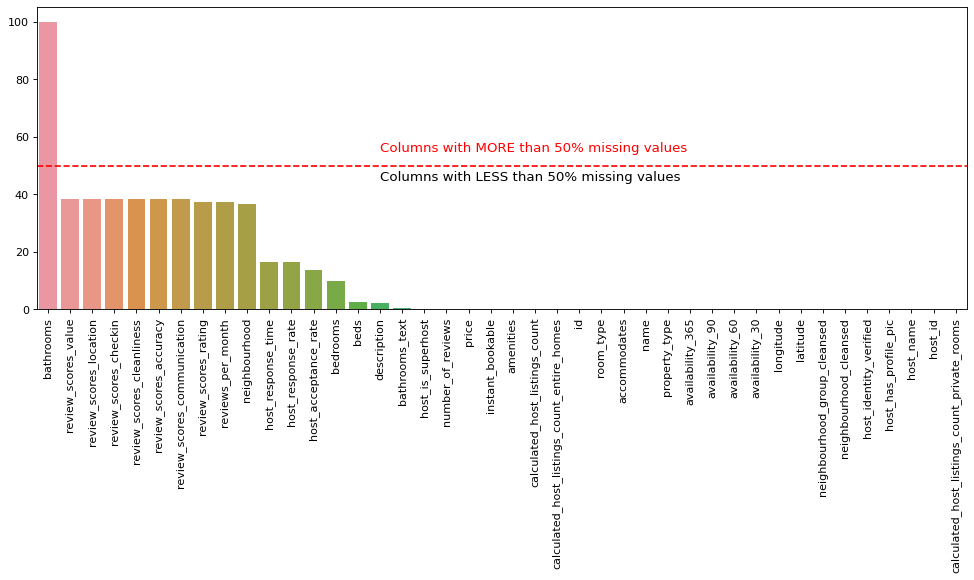

In [462]:
# Plot the bar chart of the missing values

percent_missing = listings.isnull().sum() * 100 / len(listings)
missing_value_df = pd.DataFrame({'column_name': listings.columns,
                                'percent_missing': percent_missing})

plt.figure(figsize = (15,5), dpi = 80)
plt.xticks(rotation = 90)
#Draw horizontal line at 50%
plt.axhline(50, color = 'red', linestyle = '--')
plt.text(15, 55, 'Columns with MORE than 50% missing values', color = 'red', fontsize = 12)
plt.text(15,45, 'Columns with LESS than 50% missing values', color = 'black', fontsize = 12)
sns.barplot(data = missing_value_df, x = listings.columns, y = percent_missing,
            order = missing_value_df.sort_values('percent_missing', ascending = False).column_name);

In [463]:
listings.isnull().sum().sort_values(ascending = False)

bathrooms                                       4161
review_scores_value                             1594
review_scores_location                          1594
review_scores_checkin                           1594
review_scores_cleanliness                       1594
review_scores_accuracy                          1594
review_scores_communication                     1593
review_scores_rating                            1551
reviews_per_month                               1551
neighbourhood                                   1525
host_response_time                               690
host_response_rate                               690
host_acceptance_rate                             571
bedrooms                                         404
beds                                             104
description                                       93
bathrooms_text                                    24
host_is_superhost                                  1
number_of_reviews                             

#### Reviews

In [464]:
# For the Review scores columns, we will replace the missing values with their respective mean values

listings['review_scores_rating'].fillna(listings['review_scores_rating'].mean(), inplace = True)
listings['review_scores_cleanliness'].fillna(listings['review_scores_rating'].mean(), inplace = True)
listings['review_scores_value'].fillna(listings['review_scores_value'].mean(), inplace = True)
listings['review_scores_location'].fillna(listings['review_scores_location'].mean(), inplace = True)
listings['review_scores_checkin'].fillna(listings['review_scores_checkin'].mean(), inplace = True)
listings['review_scores_accuracy'].fillna(listings['review_scores_accuracy'].mean(), inplace = True)
listings['review_scores_communication'].fillna(listings['review_scores_communication'].mean(), inplace = True)

In [465]:
listings[listings['reviews_per_month'].isnull()].head()

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms
14,481789,Master Bedroom in Newly Built Flat,Aircon Master Bedroom in a Newly Built Flat fo...,2386154,Susan,NaN,NaN,NaN,f,t,f,"Singapore, Singapore",Tampines,East Region,1.34816,103.93238,0,0,0,0,Private room in rental unit,Private room,2,NaN,1 bath,1.0,1.0,"[""Washer"", ""Kitchen"", ""Air conditioning"", ""TV""...",f,37.0,0,NaN,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,1,0,1
16,642660,BEST CITY LIVING WITH GA RESIDENCE,<b>The space</b><br />LEADING PROVIDER OF PREM...,3212572,Roger,NaN,NaN,NaN,f,t,f,NaN,Rochor,Central Region,1.30096,103.85206,30,60,90,365,Private room in rental unit,Private room,2,NaN,2 baths,1.0,1.0,"[""Gym"", ""Washer"", ""Kitchen"", ""Pool"", ""Air cond...",f,170.0,0,NaN,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,1,0,1
18,733863,Homestay at Serangoon,Theme Park with jogging track and workout corn...,3824517,Shirlnet,a few days or more,0%,NaN,f,t,f,NaN,Serangoon,North-East Region,1.36926,103.87312,30,60,90,365,Private room in rental unit,Private room,1,NaN,1 bath,1.0,1.0,"[""Iron"", ""Washer"", ""Kitchen"", ""Elevator"", ""Loc...",f,26.0,0,NaN,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,1,0,1
26,823571,Apartment away from town,<b>The space</b><br />Single bedroom with shar...,4177147,Tania,NaN,NaN,NaN,f,t,t,NaN,Bedok,East Region,1.31313,103.91479,0,0,0,0,Private room in rental unit,Private room,1,NaN,NaN,1.0,1.0,"[""Air conditioning"", ""TV"", ""Long term stays al...",f,284.0,0,NaN,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,1,0,1
39,1562453,Deluxe Quad-sharing room,"A huge, spacious quad-sharing common bedroom. ...",8270362,Domus,NaN,NaN,NaN,f,t,f,"Singapore, Singapore",Novena,Central Region,1.32359,103.84980,0,0,0,0,Private room in home,Private room,4,NaN,1 bath,1.0,4.0,"[""Wifi"", ""Washer"", ""Air conditioning"", ""Long t...",f,30.0,0,NaN,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,1,0,1


In [466]:
# For listings with no reviews_per_month, we will replace the missing values with 0
listings['reviews_per_month'].fillna(0, inplace = True)

#### Bedrooms and beds

In [467]:
# No. of null values for bedrooms
listings['bedrooms'].isnull().sum()

404

In [468]:
listings[listings['bedrooms'].isnull()].head(3)

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms
8,330089,Cozy Blue Single Room,A unit for all foreign students in a homestay ...,1439258,Kay,within an hour,99%,82%,f,t,t,NaN,Bukit Merah,Central Region,1.28652,103.81225,29,33,57,332,Private room in rental unit,Private room,1,NaN,2 shared baths,NaN,1.0,"[""Hot water"", ""Washer"", ""Kitchen"", ""Smart lock...",f,55.0,12,0.11,4.73,4.55,4.55,4.91,4.82,4.45,4.45,44,2,42
90,4486217,Sub-urban Singapore Resort Living,"Beautiful studio unit with loft, kitchen & was...",23276884,Faith,NaN,NaN,0%,f,t,f,"Singapore, Singapore",Serangoon,North-East Region,1.38763,103.86942,28,58,88,88,Entire rental unit,Entire home/apt,2,NaN,1 bath,NaN,2.0,"[""Stove"", ""Gym"", ""Washer"", ""Kitchen"", ""Oven"", ...",f,106.0,9,0.09,4.22,4.67,4.89,4.89,5.00,4.00,4.11,1,1,0
91,4499317,Heritage Collection on Seah Premium Loft,"Centrally located in City Hall, this apartment...",23336011,Heritage,within an hour,99%,83%,t,t,t,"Singapore, Singapore",Downtown Core,Central Region,1.29489,103.85401,9,36,66,339,Room in aparthotel,Entire home/apt,2,NaN,1 bath,NaN,1.0,"[""Iron"", ""Air conditioning"", ""Smoke alarm"", ""H...",t,261.0,150,1.57,4.79,4.80,4.79,4.83,4.87,4.90,4.70,51,51,0


In [469]:
# For Bedrooms, we will replace null values with the median no. of bedrooms for accomodation capacity of each listing
listings['bedrooms'].fillna(listings.groupby('accommodates')['bedrooms'].transform('median'), inplace = True)

# For Beds, we will replace null values with the median no. of beds for accomodation capacity of each listing
listings['beds'].fillna(listings.groupby('accommodates')['beds'].transform('median'), inplace = True)

In [470]:
# Let us check the null values for the bedrooms column to ensure that we have replaced the null values

In [471]:
listings[listings['bedrooms'].isnull()].head()

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms
2802,47790035,lyf Funan Singapore by Ascott | co-living space,NaN,385189116,Jay Vincent,within an hour,100%,95%,NaN,t,t,NaN,Museum,Central Region,1.292607,103.848885,0,0,0,0,Room in boutique hotel,Hotel room,0,NaN,NaN,NaN,NaN,"[""Pocket wifi"", ""Iron"", ""Dishwasher"", ""Limited...",f,0.0,0,0.0,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,1,0,0


In [472]:
# We will remove this particular listing by its ID as it has no bedrooms and no beds and no pricing
listings = listings[listings['id'] != 47790035]

In [473]:
listings[listings['bedrooms'].isnull()].head()

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms


#### Bathroom (Quantity and Type)

As the values for 'bathrooms' is empty for all rows. We will
1) Drop the columns and replaced it with 'bathrooms_text and rename 'bathrooms_text' to 'bathrooms'
2) Split the new 'bathrooms' column to 'bathroom_qty' and 'bathroom_type'

In [474]:
listings['bathrooms'].isnull().sum()

4160

In [475]:
# Drop 'bathrooms' column as it has too many missing values
listings.drop('bathrooms', axis = 1, inplace = True)

# Rename bathroom_text to bathrooms
listings.rename(columns = {'bathrooms_text':'bathrooms'}, inplace = True)

In [476]:
listings['bathrooms'].value_counts()

1 bath               1463
2 baths               753
1 private bath        629
1 shared bath         358
1.5 baths             150
3 shared baths        140
3 baths               138
2 shared baths        116
1.5 shared baths       68
2.5 baths              45
4 shared baths         32
4 baths                30
5 shared baths         25
0 shared baths         23
3.5 baths              19
Shared half-bath       18
0 baths                18
2.5 shared baths       16
6 baths                13
7 shared baths         11
8 baths                11
5 baths                 9
6 shared baths          8
Private half-bath       7
8.5 shared baths        4
4.5 baths               3
3.5 shared baths        3
8 shared baths          3
10 baths                3
5.5 baths               3
16 baths                2
21 shared baths         2
16 shared baths         2
10 shared baths         2
Half-bath               2
13 baths                2
4.5 shared baths        2
13 shared baths         1
8.5 baths   

In [477]:
listings['bathrooms'].isnull().sum()    

23

In [478]:
# Fill the missing values with '0 baths'
listings['bathrooms'].fillna('0 baths', inplace = True)

In [479]:
# Split the new 'bathrooms' column to 'bathroom_qty' and 'bathroom_type'

listings['bathroom_qty'] = listings['bathrooms'].str.split(' ').str[0]
listings['bathroom_type'] = listings['bathrooms'].str.split(' ').str[1]

##### Bathroom Quantity

In [480]:
# We can drop bathrooms column now
listings.drop('bathrooms', axis = 1, inplace = True)

In [481]:
listings['bathroom_qty'].value_counts()

1            2450
2             869
3             278
1.5           218
0              64
4              62
2.5            61
5              34
3.5            22
6              21
Shared         18
8              14
7              11
Private         7
10              5
8.5             5
4.5             5
16              4
5.5             4
13              3
21              2
Half-bath       2
7.5             1
Name: bathroom_qty, dtype: int64

In [482]:
# We will drop the listings with Shared,Private bathroom_qty, Half-bath as we want to keep the feature as numeric
listings = listings[listings['bathroom_qty'] != 'Shared']
listings = listings[listings['bathroom_qty'] != 'Private']
listings = listings[listings['bathroom_qty'] != 'Half-bath']

In [483]:
listings[listings['bathroom_qty'].isnull()].head()

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,bathroom_qty,bathroom_type


##### Bathroom Type

In [484]:
listings['bathroom_type'].value_counts()

bath       1463
baths      1223
shared      818
private     629
Name: bathroom_type, dtype: int64

In [491]:
# We will change the name from bath to baths for consistency
listings.replace('bath', 'baths', inplace = True)

In [492]:
listings['bathroom_type'].value_counts()

baths      2686
shared      818
private     629
Name: bathroom_type, dtype: int64

#### Host details

In [493]:
listings.isnull().sum().sort_values(ascending = False)

neighbourhood                                   1515
listings                                        1447
host_response_time                               683
host_response_rate                               683
host_acceptance_rate                             564
description                                       90
review_scores_checkin                              0
instant_bookable                                   0
price                                              0
number_of_reviews                                  0
reviews_per_month                                  0
review_scores_rating                               0
review_scores_accuracy                             0
review_scores_cleanliness                          0
review_scores_value                                0
review_scores_communication                        0
review_scores_location                             0
beds                                               0
calculated_host_listings_count                

##### Host Response Time

In [494]:
listings['host_response_time'].value_counts()

within an hour        1752
within a few hours     988
within a day           428
a few days or more     282
Name: host_response_time, dtype: int64

We will replace the missing values with 'unknown'.

In [495]:
listings['host_response_time'].fillna('unknown', inplace = True)

In [496]:
listings['host_response_time'].value_counts()

within an hour        1752
within a few hours     988
unknown                683
within a day           428
a few days or more     282
Name: host_response_time, dtype: int64

##### Host Response Rate #####

For the host_response_rate and host_acceptance_rate column, we will replace the missing values with the mean of the column

In [497]:
listings.isnull().sum().sort_values(ascending = False).head()

neighbourhood           1515
listings                1447
host_response_rate       683
host_acceptance_rate     564
description               90
dtype: int64

As the host response rate and host acceptance rate data type is object, we will remove the % sign and convert it to float

In [498]:
listings['host_response_rate'].value_counts()

100%    1695
91%      249
90%      214
95%      203
0%       195
97%      152
99%      144
80%       94
98%       88
34%       49
94%       45
92%       43
93%       39
96%       39
50%       31
88%       19
70%       18
75%       17
57%       17
67%       12
89%       11
33%       10
78%        9
25%        8
60%        7
73%        7
30%        6
13%        5
51%        4
58%        4
84%        3
37%        3
40%        2
44%        2
17%        1
83%        1
10%        1
87%        1
86%        1
71%        1
Name: host_response_rate, dtype: int64

In [499]:
# Remove the % sign from the values
listings['host_response_rate'] = listings['host_response_rate'].str.replace('%', '')
# Convert the column to float
listings['host_response_rate'] = listings['host_response_rate'].astype(float)
# Divide values by 100 to get the actual percentage
listings['host_response_rate'] = listings['host_response_rate']/100

In [500]:
mean_response_rate = listings['host_response_rate'].mean()

In [501]:
# Fill missing value with mean of the column
listings['host_response_rate'].fillna(value = mean_response_rate, inplace = True)

In [502]:
listings['host_response_rate'].isnull().sum()

0

##### Host Acceptance Rate #####

We will do the same for the host acceptance rate.

In [503]:
# Remove the % sign from the values
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].str.replace('%', '')
# Convert the column to float
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].astype(float)
# Divide values by 100 to get the actual percentage
listings['host_acceptance_rate'] = listings['host_acceptance_rate']/100

In [504]:
mean_acceptance_rate = listings['host_acceptance_rate'].mean()

In [505]:
# Fill missing value with mean of the column
listings['host_acceptance_rate'].fillna(value = mean_acceptance_rate, inplace = True)

In [506]:
listings['host_acceptance_rate'].value_counts()

1.000000    1112
0.730118     564
0.000000     299
0.990000     295
0.270000     217
0.230000     180
0.840000     149
0.970000     129
0.980000     124
0.860000      98
0.440000      91
0.830000      72
0.890000      59
0.820000      53
0.500000      49
0.960000      49
0.950000      39
0.930000      38
0.940000      37
0.910000      28
0.600000      27
0.670000      25
0.250000      24
0.640000      24
0.570000      23
0.300000      23
0.770000      22
0.750000      20
0.410000      19
0.700000      18
0.920000      16
0.330000      16
0.900000      14
0.290000      13
0.180000      12
0.870000      12
0.660000      11
0.480000      10
0.080000      10
0.710000      10
0.780000       9
0.350000       7
0.210000       7
0.110000       7
0.800000       7
0.460000       6
0.400000       5
0.810000       5
0.880000       5
0.170000       5
0.610000       5
0.310000       4
0.430000       4
0.360000       3
0.630000       3
0.620000       3
0.090000       2
0.790000       2
0.650000      

#### Description of listing
We will fill in the null value with '' for the listings description

In [507]:
listings.isnull().sum().sort_values(ascending = False).head()

neighbourhood    1515
listings         1447
description        90
bathroom_type       0
amenities           0
dtype: int64

In [508]:
listings['description'].fillna(value = '', inplace = True)

In [509]:
listings.isnull().sum().sort_values(ascending = False).head()

neighbourhood    1515
listings         1447
bathroom_type       0
bathroom_qty        0
beds                0
dtype: int64

Now we are left with the missing values in neighbourhood column, we will tackle that later in the notebook

### Exploratory Data Analysis
Now that we have filled in the missing data, let us perform some exploratory data analysis

Let us check out the no. of listings for each neighbourhoods

#### Listings location

In [510]:
listings.groupby('neighbourhood')['id'].count().sort_values(ascending = False)

neighbourhood
Singapore, Singapore                       1900
Johor Bahru, Johor, Malaysia                386
Nusajaya, Johor, Malaysia                   130
Tanjong Pagar, Singapore                     20
Johor Bahru, Malaysia                        19
Jurong East, Singapore                       15
Novena , Singapore                           13
Bugis, Singapore                             13
Farrer Park, Singapore                        9
Little India, Singapore                       8
n/a, Singapore                                8
Iskandar Puteri, Johor, Malaysia              7
Katong, Singapore                             7
Potong Pasir, Singapore                       5
Singapore, *, Singapore                       5
Singapore                                     5
Masai, Johor, Malaysia                        5
Chinatown, Singapore                          5
Dhoby Ghaut, Singapore                        4
Novena /Toa Payoh, Singapore                  4
Orchard , Singapore       

It seems that there are listings from Johor Bahru mixed in together in this dataset.

Let us view the AirBNB listing on the Plotly Express interactive Map

In [511]:
listings.columns

Index(['id', 'name', 'description', 'host_id', 'host_name',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'property_type', 'room_type', 'accommodates',
       'bedrooms', 'beds', 'amenities', 'instant_bookable', 'price',
       'number_of_reviews', 'reviews_per_month', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms', 'bathroom_qty',
       'bathroom_type', 'listings'],
      dtyp

In [512]:
import plotly.express as px
MAPBOX_TOKEN = 'pk.eyJ1Ijoic3BlY2t5NyIsImEiOiJjbDdnOHFvZDIwMjRzM29zYTZzdWgxYzZ3In0.vqT3OHYloU8LMZIfoFk1mQ'
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(listings, lat="latitude", lon="longitude", color="price",
                        color_continuous_scale=px.colors.sequential.Jet, 
                        hover_data = ['name','neighbourhood','neighbourhood_group_cleansed','price'], zoom=10)

fig.update_layout(title = 'Airbnb Listing locations',
    autosize=False,
    width=600,
    height=600,)

fig.show()

From the map, we can see that some Airbnb listings located in Johor Bahru have made their way into dataset.

Let us identify and remove these Airbnb from the Neighbourhood column

In [513]:
# Missing values in 'Neighbourhood' column
listings['neighbourhood'].isnull().sum()

1515

In [514]:
# Replace missing values with ''
listings['neighbourhood'] = listings['neighbourhood'].replace(np.nan, '', regex=True)
#listings['neighbourhood'].fillna(np.nan, inplace = True)

In [515]:
listings['neighbourhood'].value_counts()

Singapore, Singapore                       1900
                                           1515
Johor Bahru, Johor, Malaysia                386
Nusajaya, Johor, Malaysia                   130
Tanjong Pagar, Singapore                     20
Johor Bahru, Malaysia                        19
Jurong East, Singapore                       15
Novena , Singapore                           13
Bugis, Singapore                             13
Farrer Park, Singapore                        9
Little India, Singapore                       8
n/a, Singapore                                8
Iskandar Puteri, Johor, Malaysia              7
Katong, Singapore                             7
Singapore, *, Singapore                       5
Masai, Johor, Malaysia                        5
Singapore                                     5
Potong Pasir, Singapore                       5
Chinatown, Singapore                          5
Orchard , Singapore                           4
Novena /Toa Payoh, Singapore            

We notice that there are number of listings that are located in Johor Bahru. Let us remove these listings
1) Remove listings that are located in Johor Bahru 'neighbourhood'
2) For those JB listings not in Johor Bahru ' neighbourhood', we will remove by latitude and longitude

In [516]:
listings = listings[~listings['neighbourhood'].str.contains('Johor')]

In [517]:
# Let us check again the number of listings in Johor Bahru

import plotly.express as px
MAPBOX_TOKEN = 'pk.eyJ1Ijoic3BlY2t5NyIsImEiOiJjbDdnOHFvZDIwMjRzM29zYTZzdWgxYzZ3In0.vqT3OHYloU8LMZIfoFk1mQ'
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(listings, lat="latitude", lon="longitude", color="price",
                        color_continuous_scale=px.colors.sequential.Jet, 
                        hover_data = ['name','neighbourhood','neighbourhood_cleansed','price'], zoom=10)

fig.update_layout(title = 'AirBNB Listing locations',
    autosize=False,
    width=600,
    height=600,)

fig.show()

In [518]:
# Remove by Latitude
listings = listings[listings['latitude'] < 1.455]

In [519]:
# Let us check again the number of listings in Johor Bahru

import plotly.express as px
MAPBOX_TOKEN = 'pk.eyJ1Ijoic3BlY2t5NyIsImEiOiJjbDdnOHFvZDIwMjRzM29zYTZzdWgxYzZ3In0.vqT3OHYloU8LMZIfoFk1mQ'
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(listings, lat="latitude", lon="longitude", color="price",
                        color_continuous_scale=px.colors.sequential.Jet, 
                        hover_data = ['name','neighbourhood','neighbourhood_cleansed','price'], zoom=10)

fig.update_layout(title = 'Airbnb Listing locations',
    autosize=False,
    width=600,
    height=600,)

fig.show()

There are still JB listings towards North West of Singapore
1) Remove them based on Latitude and Longitude
2) Will also remove 2 Singapore listings, however they seem to be wrongly labelled as the listing does not match the location

In [520]:
listings = listings[listings['longitude'] > 103.67]

In [521]:
# Let us check again the number of listings in Johor Bahru

import plotly.express as px
MAPBOX_TOKEN = 'pk.eyJ1Ijoic3BlY2t5NyIsImEiOiJjbDdnOHFvZDIwMjRzM29zYTZzdWgxYzZ3In0.vqT3OHYloU8LMZIfoFk1mQ'
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(listings, lat="latitude", lon="longitude", color="price",
                        color_continuous_scale=px.colors.sequential.Jet, 
                        hover_data = ['name','neighbourhood','neighbourhood_cleansed','price'], zoom=10)

fig.update_layout(title = 'AirBNB Listing locations',
    autosize=False,
    width=600,
    height=600,)

fig.show()

<AxesSubplot:xlabel='count', ylabel='neighbourhood_cleansed'>

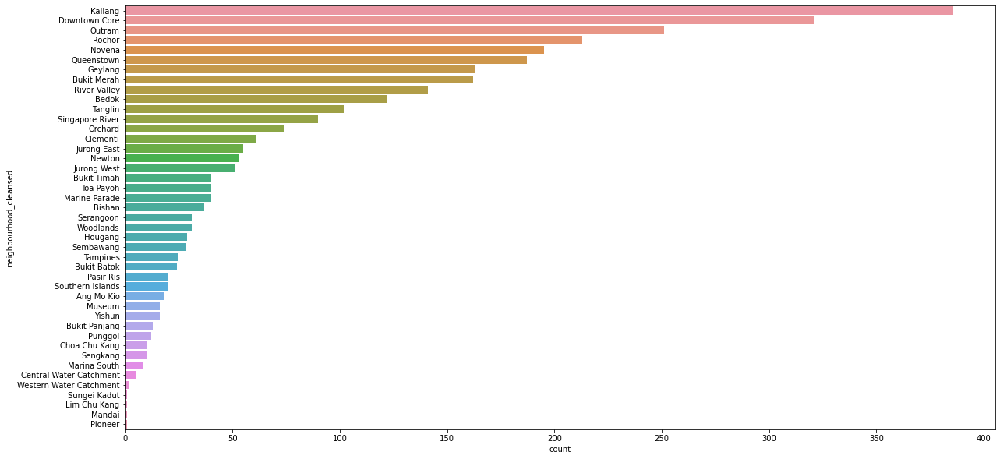

In [522]:
# PLot no. of neighbourhood to see which is the most popular
plt.figure(figsize=(20, 10))
sns.countplot(y = 'neighbourhood_cleansed', data = listings, order = listings['neighbourhood_cleansed'].value_counts().index)

In [523]:
# Drop the neighbourhood column as we will be using neighbourhood_cleansed instead
listings.drop('neighbourhood', axis = 1, inplace = True)
listings.rename(columns = {'neighbourhood_cleansed': 'neighbourhood'}, inplace = True)

In [524]:
listings.shape

(3106, 42)

#### Price


c:\Users\edmun\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



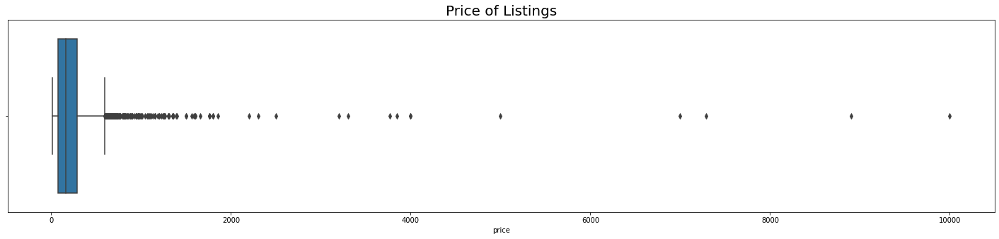

In [525]:
# Plot a boxplot to observice the prices of the listings
plt.figure(figsize=(25, 5))
sns.boxplot(listings['price'])
plt.title('Price of Listings', fontsize = 20);

In [526]:
# From the plot, we can see that there are some outliers in the price column, namely those that are above 2000. Let us take a look at these listings

In [527]:
high_price = listings[listings['price'] > 2000]

In [528]:
high_price

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,bathroom_qty,bathroom_type,listings
169,6837947,Flat for Rent,* Whole Flat for Rent<br />* Spacious rooms<br...,35833085,Benedict,unknown,0.884954,0.730118,f,t,f,Hougang,North-East Region,1.38084,103.88983,30,60,90,365,Entire rental unit,Entire home/apt,8,3.0,3.0,"[""Washer"", ""Kitchen"", ""TV"", ""Long term stays a...",f,2300.0,0,0.00,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,1,1,0,2,baths,baths
349,11544732,P,P,60916030,Yin,unknown,0.884954,0.730118,f,t,f,Outram,Central Region,1.28348,103.84135,0,0,0,0,Private room in rental unit,Private room,1,1.0,1.0,"[""First aid kit"", ""Elevator"", ""Fire extinguish...",f,7000.0,5,0.08,4.67000,4.670000,4.67000,4.330000,4.330000,4.670000,4.670000,1,0,1,1,baths,baths
368,11994937,7 wonders hostel,7 wonders hostel is a new capsule back-packers...,64134757,Seven,unknown,0.884954,0.730118,f,t,f,Kallang,Central Region,1.30909,103.85881,0,0,0,0,Shared room in rental unit,Shared room,16,1.0,16.0,"[""Breakfast"", ""Free parking on premises"", ""Hea...",f,3770.0,0,0.00,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,1,0,0,8,shared,NaN
450,14289091,One bed room condominium,One bed room private apartment with one bed r...,87219452,Michael,within an hour,1.000000,0.730118,f,t,f,Pasir Ris,East Region,1.37620,103.96172,0,0,0,0,Entire rental unit,Entire home/apt,3,1.0,1.0,"[""Gym"", ""Washer"", ""Kitchen"", ""Pool"", ""Air cond...",t,7286.0,5,0.07,4.50000,5.000000,4.50000,4.750000,4.500000,4.500000,4.750000,1,1,0,1,baths,baths
536,16155549,common room （3 minutes walking from MRT station）,House is located at center of Singapore and ve...,91481229,Lin,unknown,0.884954,0.730118,f,t,t,Toa Payoh,Central Region,1.33514,103.85017,30,60,90,181,Private room in rental unit,Private room,1,1.0,1.0,"[""Hot water"", ""Iron"", ""Washer"", ""Kitchen"", ""El...",f,4000.0,0,0.00,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,1,0,1,1,shared,NaN
552,16395877,The Club Residences - Contemporary Manor,Live life at its finest in Singapore luxury re...,84411185,Darren,a few days or more,0.000000,0.730118,f,t,f,Southern Islands,Central Region,1.25312,103.82374,23,53,83,358,Entire home,Entire home/apt,7,3.0,4.0,"[""Iron"", ""Building staff"", ""Dishwasher"", ""TV w...",f,8900.0,0,0.00,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,2,2,0,3.5,baths,baths
713,20247516,Luxury yacht 3BR豪华游艇三室三卫，配有KTV,"意大利豪华游艇,极至奢华体验。游艇上有KTV,.过夜三个卧室三个卫生间。,不包括出海.出海价...",58692882,Lily,unknown,0.884954,0.000000,f,t,t,Bukit Merah,Central Region,1.26520,103.81900,30,60,90,91,Boat,Entire home/apt,5,3.0,4.0,"[""Hot water"", ""Paid parking on premises"", ""Hos...",f,2500.0,55,0.89,4.74000,4.800000,4.91000,4.890000,4.910000,4.810000,4.780000,1,1,0,3,baths,baths
1411,31604616,EXQUISITE 2BR SUITE W/D TERRACE@SENTOSA ISLAND,"Designed to offer a little more privacy, these...",138649185,Fiona,within a few hours,0.910000,0.270000,f,t,t,Southern Islands,Central Region,1.25047,103.82309,29,59,89,364,Entire condo,Entire home/apt,4,2.0,3.0,"[""Children\u2019s books and toys"", ""Iron"", ""Bo...",f,3300.0,0,0.00,4.47359,4.599969,4.47359,4.685621,4.693384,4.701991,4.494714,217,199,18,2,baths,baths
1792,36652759,[Rare] CORNER TERRACE UP FOR Rent (Whole unit),Hi Direct owner here. Corner terrace was just ...,5654051,Jonathan,unknown,0.88

In [529]:
# We will remove the listings with price more than 1000
listings = listings[listings['price'] < 2000]

In [530]:
# Let us reset the index for listings
listings.reset_index(drop = True, inplace = True)

<AxesSubplot:xlabel='price', ylabel='Count'>

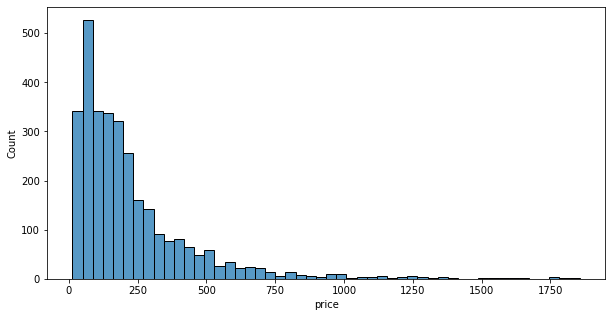

In [531]:
# Let us take a look at the distribution of the price
plt.figure(figsize=(10, 5))
sns.histplot(data = listings, x = 'price', bins = 50)

As the price is highly skewed, during the modelling phase, we will use the log transformation to normalize the data

#### Host details

Let us explore how certain features affects the price of the listings

##### Who own the most no. of listings in Singapore

In [532]:
host_listings = listings.groupby(['host_id','host_name'], as_index = False)['id'].count().sort_values(by = 'id', ascending = False)
# Rename the column
host_listings.rename(columns = {'id': 'no_of_listings'}, inplace = True)

Text(0.5, 1.0, 'Top 10 Hosts with the most listings')

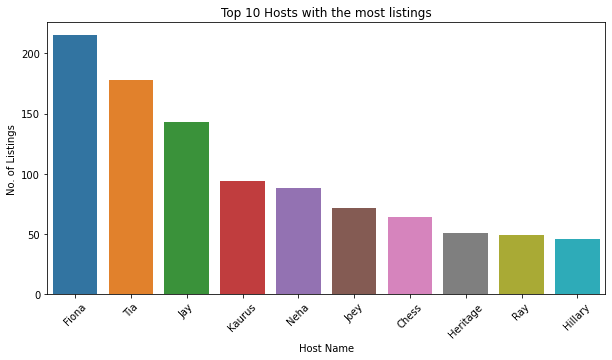

In [533]:
# Plot seaborn barplot to see the top 20 hosts with the most listings
plt.figure(figsize=(10, 5))
sns.barplot(data = host_listings.head(10), x = 'host_name', y = 'no_of_listings')
# X Axis 
plt.xticks(rotation = 45)
plt.xlabel('Host Name')
# Y Axis
plt.ylabel('No. of Listings')
# Title
plt.title('Top 10 Hosts with the most listings')

##### Whether Host is Superhost

In [534]:
listings.groupby(
    ["host_is_superhost"], 
    as_index=False
).agg(
    avg_price = ("price","mean"),
    qty = ("price","count")
)

,host_is_superhost,avg_price,qty
0,f,221.751359,2759
1,t,250.789790,333


We can see that listings with superhost are more expensive than those without.

##### Response time

In [535]:
listings.groupby(
    ["host_response_time"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'avg_price', ascending = False
).reset_index(drop = True)

,host_response_time,avg_price,qty
0,within an hour,263.538636,880
1,within a few hours,258.130115,953
2,unknown,191.922951,610
3,a few days or more,180.217742,248
4,within a day,138.768080,401


In [536]:
listings.shape

(3092, 42)

#### Neighbourhood Details

##### Neighbourhood

As the Airbnb listings have geospatial data, we will explore and visualise them using Folium to give us a better understanding of the listings in Singapore.

In [537]:
import geopandas as gpd

In [538]:
# Read the geoJSON file using geopandas
geojson = gpd.read_file('./data/neighbourhoods.geojson')

In [539]:
geojson.head()

,neighbourhood,neighbourhood_group,geometry
0,Pasir Ris,East Region,"MULTIPOLYGON (((103.95322 1.38201, 103.95350 1..."
1,Seletar,North-East Region,"MULTIPOLYGON (((103.88691 1.42649, 103.88812 1..."
2,Sungei Kadut,North Region,"MULTIPOLYGON (((103.76440 1.44345, 103.76443 1..."
3,Orchard,Central Region,"MULTIPOLYGON (((103.84298 1.30001, 103.84294 1..."
4,Simpang,North Region,"MULTIPOLYGON (((103.86350 1.43433, 103.86361 1..."


In [540]:
# Group listings by neighbourhood and count the number of listings and median price
listings_count = listings.groupby('neighbourhood')['id'].count().reset_index()
# Rename columns from id to count
listings_count.rename(columns = {'id': 'count'}, inplace = True)

In [541]:
listings_count = listings.groupby(
    ["neighbourhood"],
    as_index = False
).agg(median_price = ("price","median"),
    count = ("price","count")
).sort_values(by = 'median_price', ascending = False
).reset_index(drop = True)

In [542]:
listings_count.head()

,neighbourhood,median_price,count
0,Marina South,603.5,8
1,Orchard,510.5,74
2,Southern Islands,386.0,15
3,Clementi,320.0,61
4,Pioneer,305.0,1


In [543]:
# Merge the listings_count with the geojson
listings_map = geojson.merge(listings_count, left_on = 'neighbourhood', right_on = 'neighbourhood', how = 'outer')

In [544]:
listings_map.isnull().sum()

neighbourhood           0
neighbourhood_group     0
geometry                0
median_price           13
count                  13
dtype: int64

In [545]:
# Fill the null values with 0
listings_map.fillna(0, inplace = True)

We will create a map using Folium showing the number of listings and median price of listings in each neighbourhood.

In [546]:
# Create Singapore map and FeatureGroup Layers
sg_map = folium.Map([1.3521, 103.8198], zoom_start = 11.5, overlay = False)
fg1 = folium.FeatureGroup(name = 'Count of Airbnb listings for Neighbourhoods', overlay = False).add_to(sg_map)
fg2 = folium.FeatureGroup(name = 'Median Price of Airbnb listings for Neighbourhoods', overlay = False).add_to(sg_map)

In [547]:
# Add the first choro map to fg1 (Airbnb listings count)
custom_scale1 = listings_map['count'].quantile((0,0.2,0.4,0.6,0.8,1)).tolist()

listings_count = folium.Choropleth(
    geo_data = r'./data/neighbourhoods.geojson',
    data = listings_map,
    columns = ['neighbourhood','count'], # Here we tell folium to get neighbourhood and count from our listings_map dataframe
    key_on='feature.properties.neighbourhood', # Here we tell folium to get the neighbourhood from the geojson file
    threshold_scale = custom_scale1, # Use the scale that we have created for legend
    fill_color='YlOrRd',
    nan_fill_color="White", #Use white color if there is no data available for the county
    fill_opacity=0.7,
    ine_opacity=0.2,
    legend_name='Count of Airbnb listings for Neighbourhoods', #title of the legend
    highlight=True,
    Overlay = False,
    line_color='black').geojson.add_to(fg1) # Add the choropleth map to our base map

# Add customised tooltips to the map
folium.features.GeoJson(
    data = listings_map,
    name = 'Count of Airbnb listings for Neighbourhoods',
    smooth_factor = 2,
    style_function = lambda x: {'color':'black', 'fillColor':'transparent','weight':0.5},
    tooltip = folium.features.GeoJsonTooltip(
        fields = ['neighbourhood', 'neighbourhood_group','count'],
        aliases = ['Neighbourhood: ', 'Neighbourhood Group: ', 'Count: '],
        localize = True,
        sticky = False,
        labels = True,
        style="""
            background-color: #F0EFEF;
            border: 2px solid black;
            border-radius: 3px;
            box-shadow: 3px;
        """,
        max_width=800,),
            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
        ).add_to(listings_count)

In [548]:
# Add the second choro map to fg2 (Median listings of neighbourhoods)
custom_scale2 = listings_map['median_price'].quantile((0,0.2,0.4,0.6,0.8,1)).tolist()

listings_median = folium.Choropleth(
    geo_data = r'./data/neighbourhoods.geojson',
    data = listings_map,
    columns = ['neighbourhood','median_price'], # Here we tell folium to get neighbourhood and count from our listings_map dataframe
    key_on='feature.properties.neighbourhood', # Here we tell folium to get the neighbourhood from the geojson file
    threshold_scale = custom_scale2, # Use the scale that we have created for legend
    fill_color='YlOrRd',
    nan_fill_color="White", #Use white color if there is no data available for the county
    fill_opacity=0.7,
    ine_opacity=0.2,
    legend_name='Count of Airbnb listings for Neighbourhoods', #title of the legend
    highlight=True,
    Overlay = False,
    line_color='black').geojson.add_to(fg2) # Add the choropleth map to our base map

# Add customised tooltips to the map
folium.features.GeoJson(
    data = listings_map,
    name = 'Median price of Airbnb listings for Neighbourhoods',
    smooth_factor = 2,
    style_function = lambda x: {'color':'black', 'fillColor':'transparent','weight':0.5},
    tooltip = folium.features.GeoJsonTooltip(
        fields = ['neighbourhood', 'neighbourhood_group','median_price'],
        aliases = ['Neighbourhood: ', 'Neighbourhood Group: ', 'Median Price: '],
        localize = True,
        sticky = False,
        labels = True,
        style="""
            background-color: #F0EFEF;
            border: 2px solid black;
            border-radius: 3px;
            box-shadow: 3px;
        """,
        max_width=800,),
            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
        ).add_to(listings_median)

In [549]:
# Add the layer control
folium.TileLayer('cartodbdark_matter', overlay = True, name = "View in dark mode").add_to(sg_map)
folium.TileLayer('cartodbpositron', overlay = True, name = "View in light mode").add_to(sg_map)
folium.LayerControl(collapsed = False).add_to(sg_map)

# # Show the map
sg_map

##### Neighbourhood group

In [550]:
listings.groupby(
    ["neighbourhood_group_cleansed"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'avg_price', ascending = False
).reset_index(drop = True)

,neighbourhood_group_cleansed,avg_price,qty
0,Central Region,238.026493,2529
1,West Region,191.640553,217
2,North-East Region,175.919192,99
3,East Region,148.436364,165
4,North Region,120.268293,82


Text(0.5, 1.0, 'Price of Airbnb listings in each Neighbourhood Group')

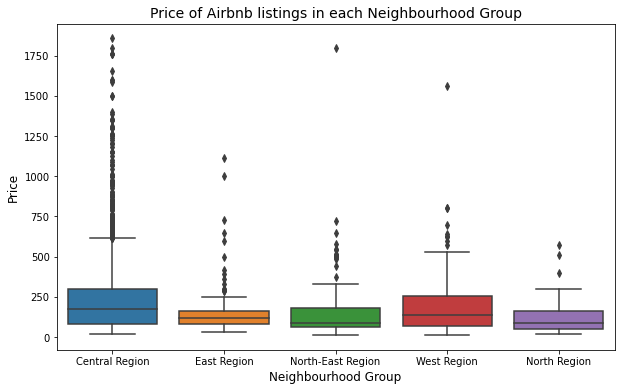

In [551]:
# Plot the box plot for the Price of listings in each neighbourhood group
plt.figure(figsize = (10,6))
sns.boxplot(x = 'neighbourhood_group_cleansed', y = 'price', data = listings)
plt.xlabel('Neighbourhood Group', fontsize = 12)
plt.ylabel('Price', fontsize = 12)
plt.title('Price of Airbnb listings in each Neighbourhood Group', fontsize = 14)

#### Property details

In [552]:
listings.head(3)

,id,name,description,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_group_cleansed,latitude,longitude,availability_30,availability_60,availability_90,availability_365,property_type,room_type,accommodates,bedrooms,beds,amenities,instant_bookable,price,number_of_reviews,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,bathroom_qty,bathroom_type,listings
0,50646,Pleasant Room along Bukit Timah,Fully furnished bedroom with a nice view on th...,227796,Sujatha,a few days or more,0.0,0.730118,f,t,t,Bukit Timah,Central Region,1.33432,103.78521,30,60,90,365,Private room in rental unit,Private room,2,1.0,1.0,"[""Gym"", ""Washer"", ""Kitchen"", ""TV with standard...",f,80.0,18,0.18,4.56,4.72,4.78,4.78,4.94,4.72,4.50,1,0,1,1,baths,baths
1,71609,Ensuite Room (Room 1 & 2) near EXPO,For 3 rooms.Book room 1&2 and room 4<br /><br ...,367042,Belinda,within an hour,1.0,1.000000,f,t,t,Tampines,East Region,1.34537,103.95887,5,35,65,340,Private room in villa,Private room,6,2.0,3.0,"[""Children\u2019s books and toys"", ""Iron"", ""Ke...",f,145.0,20,0.15,4.44,4.37,4.00,4.63,4.78,4.26,4.32,6,0,6,1,private,NaN
2,289234,Booking for 3 bedrooms,This whole place can accomodate 8 pax with own...,367042,Belinda,within an hour,1.0,1.000000,f,t,t,Tampines,East Region,1.34490,103.95979,0,0,10,285,Private room in home,Private room,4,3.0,5.0,"[""Children\u2019s books and toys"", ""Iron"", ""Pa...",t,184.0,12,0.10,4.83,4.67,4.75,4.58,4.67,4.33,4.45,6,0,6,3,baths,baths


#### Room type

In [553]:
listings.groupby(
    ["room_type"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'avg_price', ascending = False
).reset_index(drop = True)

,room_type,avg_price,qty
0,Entire home/apt,309.301518,1383
1,Hotel room,170.507576,132
2,Private room,160.746238,1462
3,Shared room,87.330435,115


Text(0.5, 1.0, 'Price of Airbnb listings by Room Type')

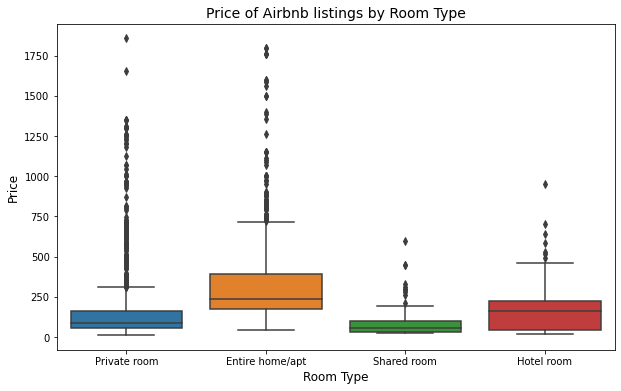

In [554]:
# Plot the box plot for the Price of listings by Room type
plt.figure(figsize = (10,6))
sns.boxplot(x = 'room_type', y = 'price', data = listings)
plt.xlabel('Room Type', fontsize = 12)
plt.ylabel('Price', fontsize = 12)
plt.title('Price of Airbnb listings by Room Type', fontsize = 14)

In [555]:
# Let us check out the average price and number of listings for each property type
listings.groupby(
    ["property_type"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'qty', ascending = False
).reset_index(drop = True)

,property_type,avg_price,qty
0,Private room in rental unit,87.604414,589
1,Entire condo,289.591356,509
2,Entire serviced apartment,350.536817,421
3,Entire rental unit,294.613636,352
4,Private room in condo,110.289796,245
5,Room in boutique hotel,299.333333,147
6,Private room in home,110.965517,145
7,Room in hotel,482.276119,134
8,Room in hostel,66.328125,64
9,Private room in townhouse,100.300000,50


In [583]:
# As there are many different property type, we will replace them into 7 different categories
listings.loc[listings['property_type'].str.contains('condo'), 'property_type'] = 'Condominium'
listings.loc[listings['property_type'].str.contains('apartment|aparthotel|bed and breakfast|unit|loft'), 'property_type'] = 'Apartment'
listings.loc[listings['property_type'].str.contains('hotel'), 'property_type'] = 'Hotel'
listings.loc[listings['property_type'].str.contains('hostel'), 'property_type'] = 'Hostel'
listings.loc[listings['property_type'].str.contains('home|guest suite|private room|shared room', case = False), 'property_type'] = 'Home'
listings.loc[listings['property_type'].str.contains('bungalow|villa|guesthouse|townhouse|entire place', case = False), 'property_type'] = 'House'
listings.loc[listings['property_type'].str.contains('boat|Campsite|Casa particular', case = False), 'property_type'] = 'Others'

In [584]:
# Let us check out the average price and number of listings for each property type
listings.groupby(
    ["property_type"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'qty', ascending = False
).reset_index(drop = True)

,property_type,avg_price,qty
0,Apartment,219.077270,1553
1,Condominium,231.234828,758
2,Home,140.669697,330
3,Hotel,374.108475,295
4,Hostel,105.359712,139
5,House,348.500000,10
6,Others,701.285714,7


Text(0.5, 1.0, 'Price of Airbnb listings by Property type')

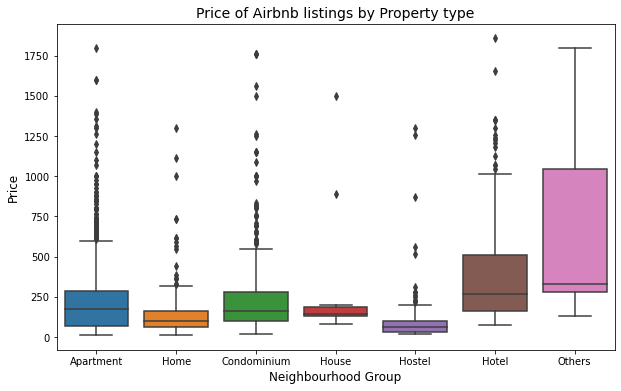

In [585]:
# Plot the box plot for the Price of listings in each neighbourhood group
plt.figure(figsize = (10,6))
sns.boxplot(x = 'property_type', y = 'price', data = listings)
plt.xlabel('Neighbourhood Group', fontsize = 12)
plt.ylabel('Price', fontsize = 12)
plt.title('Price of Airbnb listings by Property type', fontsize = 14)

In [586]:
# Let us plot the property type on Folium
# Create a base map
sg_map = folium.Map(location = [1.3521, 103.8198], zoom_start = 11, tiles = 'cartodbdark_matter')

In [587]:
# Plot the property type on the map
coord_list = listings[["latitude", "longitude"]].values.tolist()
name_series = listings['name'].fillna("").reset_index(drop=True)

color = listings['property_type'].map({'Condominium':'red', 'Apartment':'blue', 'Hotel':'green', 'Hostel':'orange', 'Home':'purple', 'House':'pink', 'Others':'grey'})

for listing in range(0, len(coord_list)):
    folium.CircleMarker(coord_list[listing], popup = name_series[listing], color = color[listing], radius =1).add_to(sg_map)

#sg_map

In [588]:
from branca.element import Template, MacroElement

In [589]:
template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:red;opacity:0.7;'></span>Condominium</li>
    <li><span style='background:blue;opacity:0.7;'></span>Apartment</li>
    <li><span style='background:green;opacity:0.7;'></span>Hotel</li>
    <li><span style='background:orange;opacity:0.7;'></span>Hostel</li>
    <li><span style='background:purple;opacity:0.7;'></span>Home</li>
    <li><span style='background:pink;opacity:0.7;'></span>House</li>
    <li><span style='background:grey;opacity:0.7;'></span>Others</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

sg_map.get_root().add_child(macro)

sg_map

##### Accommodations, Bedrooms and beds

In [590]:
listings.groupby(
    ["bedrooms"],
    as_index = False
).agg(avg_price = ("price","mean"),
    qty = ("price","count")
).sort_values(by = 'qty', ascending = False
).reset_index(drop = True)

,bedrooms,avg_price,qty
0,1.0,181.934721,2451
1,2.0,355.676399,411
2,3.0,445.098522,203
3,4.0,489.739130,23
4,5.0,400.250000,4


Text(0.5, 1.0, 'No. of listings by Beds')

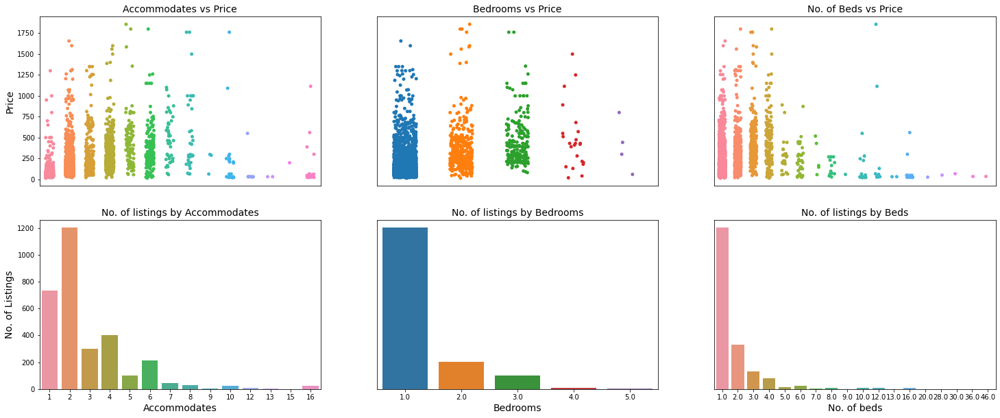

In [591]:
# Let us look at how the listings prices affected by the number of bedrooms and beds

fig, axes = plt.subplots(2,3, figsize = (25,10))

# Accomodates vs Price
sns.stripplot(data = listings, x = 'accommodates', y = 'price', ax = axes[0,0], jitter = 0.2)
axes[0,0].get_xaxis().set_visible(False)
axes[0,0].set_ylabel('Price', fontsize = 14)
axes[0,0].set_title('Accommodates vs Price', fontsize = 14)
# Bedrooms vs Price
sns.stripplot(data = listings, x = 'bedrooms', y = 'price', ax = axes[0,1], jitter = 0.2)
axes[0,1].get_xaxis().set_visible(False)
axes[0,1].get_yaxis().set_visible(False)
axes[0,1].set_title('Bedrooms vs Price', fontsize = 14)
# Beds vs Price
sns.stripplot(data = listings, x = 'beds', y = 'price', ax = axes[0,2], jitter = 0.2)
axes[0,2].get_xaxis().set_visible(False)
axes[0,2].get_yaxis().set_visible(False)
axes[0,2].set_title('No. of Beds vs Price', fontsize = 14)

# Accomodates vs Count
sns.countplot(data = listings, x = 'accommodates', ax = axes[1,0])
axes[1,0].set_xlabel('Accommodates', fontsize = 14)
axes[1,0].set_ylabel('No. of Listings', fontsize = 14)
axes[1,0].set_title('No. of listings by Accommodates', fontsize = 14)

# Bedrooms vs Count
sns.countplot(data = listings, x = 'bedrooms', ax = axes[1,1])
axes[1,1].set_xlabel('Bedrooms', fontsize = 14)
axes[1,1].get_yaxis().set_visible(False)
axes[1,1].set_title('No. of listings by Bedrooms', fontsize = 14)

# Beds vs Count
sns.countplot(data = listings, x = 'beds', ax = axes[1,2])
axes[1,2].set_xlabel('No. of beds', fontsize = 14)
axes[1,2].get_yaxis().set_visible(False)
axes[1,2].set_title('No. of listings by Beds', fontsize = 14)

In [592]:
# Let us see the maximum number of bedrooms and beds for each property type
listings.groupby(
    ["property_type"],
    as_index = False
).agg(max_bedrooms = ("bedrooms","max"),
    max_beds = ("beds","max")
).sort_values(by = 'max_bedrooms', ascending = False
).reset_index(drop = True)


,property_type,max_bedrooms,max_beds
0,Apartment,5.0,16.0
1,Condominium,5.0,7.0
2,Home,5.0,30.0
3,House,4.0,12.0
4,Hostel,3.0,46.0
5,Hotel,3.0,12.0
6,Others,2.0,4.0


##### Bathrooms

In [593]:
listings['bathroom_type'].value_counts()

baths      1712
shared      784
private     596
Name: bathroom_type, dtype: int64

In [594]:
listings['bathroom_qty'].value_counts()

1     1948
2      698
3      229
0       62
4       57
5       34
6       21
8       13
7       11
9        5
10       5
16       4
13       3
21       2
Name: bathroom_qty, dtype: int64

In [595]:
# Round up the bathroom quantity to an integer
listings['bathroom_qty'].replace('0.5', '1', inplace = True)
listings['bathroom_qty'].replace('1.5', '2', inplace = True)
listings['bathroom_qty'].replace('2.5', '3', inplace = True)
listings['bathroom_qty'].replace('3.5', '4', inplace = True)
listings['bathroom_qty'].replace('4.5', '5', inplace = True)
listings['bathroom_qty'].replace('5.5', '6', inplace = True)
listings['bathroom_qty'].replace('6.5', '7', inplace = True)
listings['bathroom_qty'].replace('7.5', '8', inplace = True)
listings['bathroom_qty'].replace('8.5', '9', inplace = True) 

In [596]:
listings['bathroom_qty'].value_counts()

1     1948
2      698
3      229
0       62
4       57
5       34
6       21
8       13
7       11
9        5
10       5
16       4
13       3
21       2
Name: bathroom_qty, dtype: int64

#### Amenities

In [597]:
# It seems that the amenities column is a list of amenities provided by the host
listings['amenities']

0       Gym, Washer, Kitchen, TV with standard cable, ...
1       Children\u2019s books and toys, Iron, Keypad, ...
2       Children\u2019s books and toys, Iron, Paid par...
3       Private patio or balcony, Iron, Air conditioni...
4       Hot water, Washer, Kitchen, Smart lock, Hair d...
5       Hot water, Washer, Kitchen, Smart lock, Lock o...
6       Iron, Washer, Kitchen, Elevator, Smart lock, S...
7       Children\u2019s books and toys, Iron, Keypad, ...
8       Iron, Air conditioning, Smoke alarm, Hangers, ...
9       Iron, TV with standard cable, Air conditioning...
10      Backyard, Iron, Washer, Kitchen, Elevator, Loc...
11      Washer, Kitchen, Air conditioning, TV, Long te...
12      Iron, Air conditioning, Hangers, Essentials, D...
13      Gym, Washer, Kitchen, Pool, Air conditioning, ...
14      Iron, Washer, Kitchen, Hair dryer, Air conditi...
15      Iron, Washer, Kitchen, Elevator, Lock on bedro...
16      Iron, Paid parking on premises, TV with standa...
17      Iron, 

In [598]:
# # We will have to clean the amenities column by removing the brackets and the quotation marks
listings['amenities'] = listings['amenities'].str.replace('[', '')
listings['amenities'] = listings['amenities'].str.replace(']', '')
listings['amenities'] = listings['amenities'].str.replace('"', '')  

<ipython-input-598-0b7268076ffb>:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.

<ipython-input-598-0b7268076ffb>:3: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.



In [599]:
listings['amenities']

0       Gym, Washer, Kitchen, TV with standard cable, ...
1       Children\u2019s books and toys, Iron, Keypad, ...
2       Children\u2019s books and toys, Iron, Paid par...
3       Private patio or balcony, Iron, Air conditioni...
4       Hot water, Washer, Kitchen, Smart lock, Hair d...
5       Hot water, Washer, Kitchen, Smart lock, Lock o...
6       Iron, Washer, Kitchen, Elevator, Smart lock, S...
7       Children\u2019s books and toys, Iron, Keypad, ...
8       Iron, Air conditioning, Smoke alarm, Hangers, ...
9       Iron, TV with standard cable, Air conditioning...
10      Backyard, Iron, Washer, Kitchen, Elevator, Loc...
11      Washer, Kitchen, Air conditioning, TV, Long te...
12      Iron, Air conditioning, Hangers, Essentials, D...
13      Gym, Washer, Kitchen, Pool, Air conditioning, ...
14      Iron, Washer, Kitchen, Hair dryer, Air conditi...
15      Iron, Washer, Kitchen, Elevator, Lock on bedro...
16      Iron, Paid parking on premises, TV with standa...
17      Iron, 

In [600]:
amenities = listings['amenities']

In [601]:
# Create a dictionary to store the amenities and their counts
amenities_dict = {}

# Loop through the amenities column and count the number of times each amenity appears
for i in amenities:
    for j in i.split(','):
        if j in amenities_dict:
            amenities_dict[j] += 1
        else:
            amenities_dict[j] = 1

In [602]:
amenities_dict

{'Gym': 54,
 ' Washer': 2243,
 ' Kitchen': 2356,
 ' TV with standard cable': 576,
 ' Cable TV': 599,
 ' Pool': 1342,
 ' Air conditioning': 2828,
 ' Long term stays allowed': 3054,
 ' Wifi': 2953,
 ' Elevator': 1521,
 ' Essentials': 2574,
 ' Shampoo': 1713,
 'Children\\u2019s books and toys': 38,
 ' Iron': 625,
 ' Keypad': 339,
 ' Fire pit': 18,
 ' Smoke alarm': 1615,
 ' Hangers': 2364,
 ' Dryer': 1816,
 ' Hot water': 1593,
 ' Hair dryer': 2029,
 ' Cooking basics': 1327,
 ' Fire extinguisher': 1485,
 ' Outdoor furniture': 145,
 ' Refrigerator': 1692,
 ' Outdoor dining area': 172,
 ' Shared hot tub': 38,
 ' Luggage dropoff allowed': 959,
 ' BBQ grill': 395,
 ' Free street parking': 354,
 ' Free parking on premises': 860,
 ' Private fenced garden or backyard': 13,
 ' Lock on bedroom door': 1114,
 ' TV': 1632,
 ' Dedicated workspace': 705,
 ' Private entrance': 977,
 ' Paid parking on premises': 500,
 ' AC - split type ductless system': 72,
 ' Bathtub': 488,
 ' Security cameras on property

In [603]:
# Create a dataframe from the dictionary
amenities_df = pd.DataFrame.from_dict(amenities_dict, orient = 'index', columns = ['count']).sort_values(by = 'count', ascending = False).reset_index()
amenities_df.rename(columns = {'index': 'amenities'}, inplace = True)

In [604]:
print(amenities_df)

                                             amenities  count
0                              Long term stays allowed   3054
1                                                 Wifi   2953
2                                     Air conditioning   2828
3                                           Essentials   2574
4                                              Hangers   2364
5                                              Kitchen   2356
6                                               Washer   2243
7                                           Hair dryer   2029
8                                                Dryer   1816
9                                              Shampoo   1713
10                                        Refrigerator   1692
11                                                Iron   1637
12                                                  TV   1632
13                                         Smoke alarm   1615
14                                           Hot water   1593
15      

In [605]:
# It seems like there are similar amenities with different names
# We can group them together

# Long Term Stays Allowed
amenities_df.loc[amenities_df['amenities'].str.contains('Long term stays allowed', case = False), 'amenities'] = 'Long term stays allowed'

# Air Conditioning
amenities_df.loc[amenities_df['amenities'].str.contains('Air conditioning|AC', case = False), 'amenities'] = 'Air conditioning'

# Toiletries
amenities_df.loc[amenities_df['amenities'].str.contains('Soap|Shampoo|Conditioner|Toiletries|Shower gel|Essentials', case = False), 'amenities'] = 'Essentials'

# Internet
amenities_df.loc[amenities_df['amenities'].str.contains('Wifi|Ethernet connection', case = False), 'amenities'] = 'Wifi'

# Dryer
amenities_df.loc[amenities_df['amenities'].str.contains('Dryer', case = False), 'amenities'] = 'Dryer'

# Washer
amenities_df.loc[amenities_df['amenities'].str.contains('Washer', case = False), 'amenities'] = 'Washer'

# Refrigerator
amenities_df.loc[amenities_df['amenities'].str.contains('Refrigerator|Fridge|Freezer', case = False), 'amenities'] = 'Refrigerator'

# Parking (Free/Paid)
amenities_df.loc[amenities_df['amenities'].str.contains('Parking', case = False), 'amenities'] = 'Parking'

# Smoke Alarm
amenities_df.loc[amenities_df['amenities'].str.contains('Alarm', case = False), 'amenities'] = 'Smoke alarm'

# Fire Extinguisher
amenities_df.loc[amenities_df['amenities'].str.contains('Extinguisher', case = False), 'amenities'] = 'Fire extinguisher'

# Swimming Pool
amenities_df.loc[amenities_df['amenities'].str.contains('Pool', case = False), 'amenities'] = 'Swimming pool'

# Kitchen
amenities_df.loc[amenities_df['amenities'].str.contains('Cooking|Stove|Oven|Kitchen|Kitchenette', case = False), 'amenities'] = 'Cooking basics'

# Television
amenities_df.loc[amenities_df['amenities'].str.contains('TV', case = False), 'amenities'] = 'Television'

# Gym
amenities_df.loc[amenities_df['amenities'].str.contains('Gym', case = False), 'amenities'] = 'Gym'

# Private entrance
amenities_df.loc[amenities_df['amenities'].str.contains('Private entrance', case = False), 'amenities'] = 'Private entrance'

# Dishes and silverware
amenities_df.loc[amenities_df['amenities'].str.contains('Dishes and silverware', case = False), 'amenities'] = 'Dishes and silverware'

# Patio or Balcony
amenities_df.loc[amenities_df['amenities'].str.contains('Patio or balcony', case = False), 'amenities'] = 'Patio or balcony'

# Bathtub
amenities_df.loc[amenities_df['amenities'].str.contains('Bathtub|Hot tub', case = False), 'amenities'] = 'Bathtub'

# Backyard
amenities_df.loc[amenities_df['amenities'].str.contains('Backyard|Garden', case = False), 'amenities'] = 'Garden'

# Security Cameras
amenities_df.loc[amenities_df['amenities'].str.contains('Security cameras', case = False), 'amenities'] = 'Security camera'

# Dedicated Workspace
amenities_df.loc[amenities_df['amenities'].str.contains('Workspace', case = False), 'amenities'] = 'Dedicated workspace'

# Crib
amenities_df.loc[amenities_df['amenities'].str.contains('Crib', case = False), 'amenities'] = 'Crib'

# Chilren books
amenities_df.loc[amenities_df['amenities'].str.contains('Books', case = False), 'amenities'] = 'Children books and Toys'

# Breakfast
amenities_df.loc[amenities_df['amenities'].str.contains('Breakfast', case = False), 'amenities'] = 'Breakfast'

# Clothing Storage
amenities_df.loc[amenities_df['amenities'].str.contains('Clothing storage|Wardrobe|Dresser', case = False), 'amenities'] = 'Clothing storage'

# Sound System
amenities_df.loc[amenities_df['amenities'].str.contains('Sound', case = False), 'amenities'] = 'Sound system'

# Key Pad
amenities_df.loc[amenities_df['amenities'].str.contains('Keypad', case = False), 'amenities'] = 'Key pad'

In [606]:
# We see that there are some multiple instances of the same amenities
# We will perform a groupby to combine them
amenities_df = amenities_df.groupby('amenities')['count'].sum().sort_values(ascending = False).reset_index()

In [607]:
# We have managed to reduce the number of amenities from 321 to 116
amenities_df

,amenities,count
0,Cooking basics,5722
1,Essentials,5248
2,Air conditioning,4680
3,Dryer,4019
4,Wifi,3134
5,Long term stays allowed,3075
6,Television,2908
7,Washer,2686
8,Parking,2388
9,Hangers,2364


<AxesSubplot:xlabel='count', ylabel='amenities'>

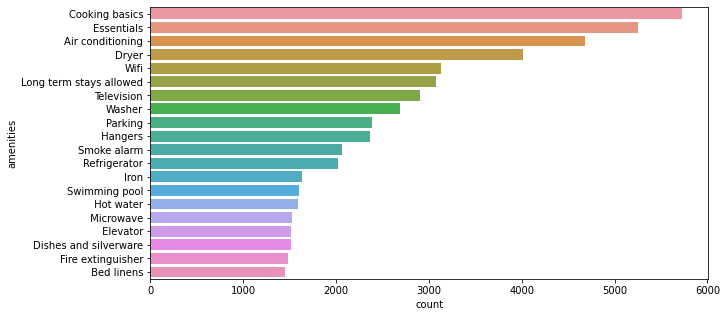

In [608]:
# Plot the top 20 amenities count
plt.figure(figsize=(10, 5))
sns.barplot(x = 'count', y = 'amenities', data = amenities_df.head(20))

In [609]:
#### Save cleaned listing data to pickle file
listings.to_pickle('./data/listings_cleaned.pkl')